In [ ]:
import tkinter as tk
from PIL import Image, ImageGrab, ImageDraw, ImageFont

In [ ]:
image_path = "./image/screenshot.png"

In [ ]:
# import pyautogui

# myScreenshot = pyautogui.screenshot()
# myScreenshot.save(image_path)

In [ ]:
# import tkinter as tk

# # Create the main window
# root = tk.Tk()

# # Load the image and create a PhotoImage object
# image = tk.PhotoImage(file="text.png")

# # Create a label with the image and add it to the window
# label = tk.Label(root, image=image)
# label.pack()

# # Raise the label to the top of the window stack
# label.lift()

# # Start the main event loop
# root.mainloop()

In [ ]:
from paddleocr import PaddleOCR,draw_ocr
# Paddleocr supports Chinese, English, French, German, Korean and Japanese.
# You can set the parameter `lang` as `ch`, `en`, `french`, `german`, `korean`, `japan`
# to switch the language model in order.

ocr = PaddleOCR(use_angle_cls=False, lang='french') # need to run only once to download and load model into memory

In [ ]:
result = ocr.ocr(image_path, cls=True)
# for idx in range(len(result)):
#     res = result[idx]
#     for line in res:
#         print(line)

In [ ]:
# result

In [ ]:
# draw result
from PIL import Image
result = result[0]
image = Image.open(image_path).convert('RGB')
boxes = [line[0] for line in result]
txts = [line[1][0] for line in result]
scores = [line[1][1] for line in result]
im_show = draw_ocr(image, boxes, txts, scores, font_path='/path/to/PaddleOCR/doc/fonts/simfang.ttf')
im_show = Image.fromarray(im_show)
#im_show.save('result.jpg')

In [ ]:
im_show

In [ ]:
from src.utils import draw_ocr_boxes

In [ ]:
image_draw = draw_ocr_boxes(image, boxes, txts, scores)

In [ ]:
im_show = image_draw

In [ ]:
im_show

In [ ]:
import numpy as np

In [ ]:
box = np.reshape(np.array(boxes[0]), [-1, 1, 2]).astype(np.int64)

In [ ]:
box

In [ ]:
im_show

In [ ]:
txts

In [ ]:
pause

In [ ]:
# get an image
with Image.open(image_path).convert("RGBA") as base:

    # make a blank image for the text, initialized to transparent text color
    txt = Image.new("RGBA", base.size, (255, 255, 255, 0))

    # get a font
    fnt = ImageFont.truetype("./font/SourceCodePro-Black.ttf", 40)
    # get a drawing context
    d = ImageDraw.Draw(txt)

    # draw text, half opacity
    d.text((50, 100), "Hello", font=fnt, fill=(255, 0, 255, 255))
    # draw text, full opacity
    d.text((1000, 1000), "World", font=fnt, fill=(255, 0, 255, 255))

    out = Image.alpha_composite(base, txt)

    out.show()

# 翻译

In [ ]:
# from translate import Translator
# translator = Translator(from_lang='fr', to_lang='zh')
# translation = translator.translate(txts[1])
# print(txts[1], translation)

In [ ]:
import mtranslate

In [ ]:
mtranslate.translate("Bonjour, monsieur!\n Bonjour, madame! \n Bon annee!", "zh-CN", "fr",)

# 测试

In [2]:
from src.game_learn import GameLearn
game_learn = GameLearn()

[2023/05/02 13:17:22] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\Yizhou Zhao/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\Yizhou Zhao/.paddleocr/whl\\rec\\latin\\latin_PP-OCRv3_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_

In [3]:
result = game_learn.perform_ocr()

....performing ocr inference....
[2023/05/02 13:17:23] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/05/02 13:17:23] ppocr DEBUG: dt_boxes num : 26, elapse : 0.36699891090393066
[2023/05/02 13:17:26] ppocr DEBUG: rec_res num  : 26, elapse : 2.8079993724823


....performing translation....
....end translation....
org: (474.0, 23.0) text: 定居生存URP
org: (1099.0, 492.0) text: 沉降
org: (1078.0, 651.0) text: 生存
org: (722.0, 947.0) text: 继续
org: (794.0, 1044.0) text: 新的部分
org: (710.0, 1153.0) text: 加载
org: (722.0, 1248.0) text: 教程
org: (751.0, 1348.0) text: 设置
org: (678.0, 1453.0) text: 模组
org: (722.0, 1558.0) text: 广告
org: (698.0, 1661.0) text: 辞职
org: (3666.0, 2054.0) text: 晚上 10:46
org: (2186.0, 2082.0) text: X
org: (3666.0, 2110.0) text: 2023 年 5 月 1 日


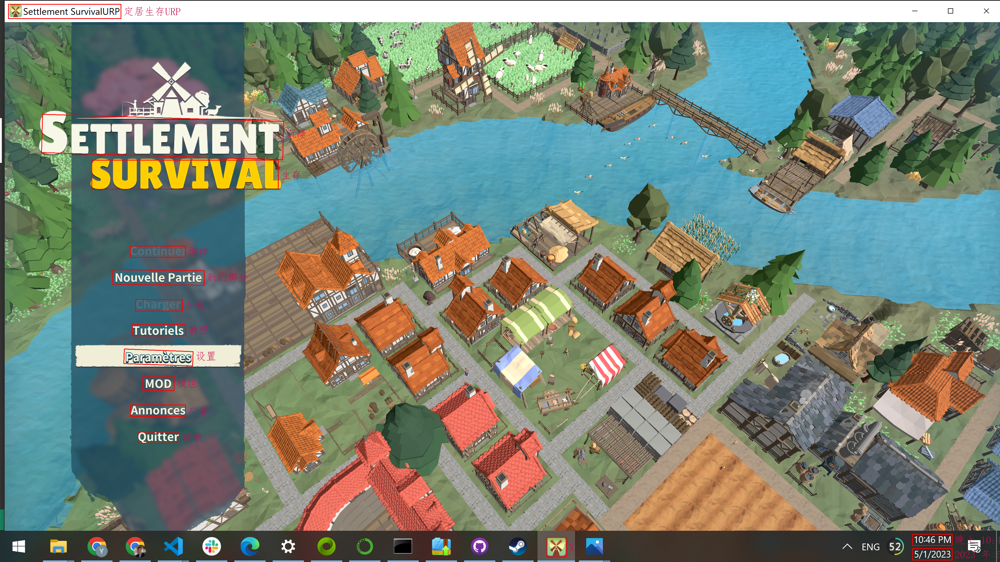

In [4]:
game_learn.draw_ocr(result, True, True)